*****(A)*****

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import os
import seaborn as sns

In [11]:
# Path to the directory containing images and the CSV file
data_directory = 'data'

# Load the labels
labels_path ='label.csv'
labels_df = pd.read_csv(labels_path)

# Display basic information about the dataset
print("Dataset overview:")
print(labels_df.describe())
print("\nNumber of images per class:")
print(labels_df['label'].value_counts())

Dataset overview:
           filename    label
count         12600    12600
unique        12600       15
top     Image_1.jpg  sitting
freq              1      840

Number of images per class:
label
sitting               840
using_laptop          840
hugging               840
sleeping              840
drinking              840
clapping              840
dancing               840
cycling               840
calling               840
laughing              840
eating                840
fighting              840
listening_to_music    840
running               840
texting               840
Name: count, dtype: int64



Image size distribution:
              Width        Height
count  12600.000000  12600.000000
mean     260.381032    196.573571
std       39.919281     35.281402
min       84.000000     84.000000
25%      254.000000    181.000000
50%      275.000000    183.000000
75%      276.000000    194.000000
max      478.000000    318.000000


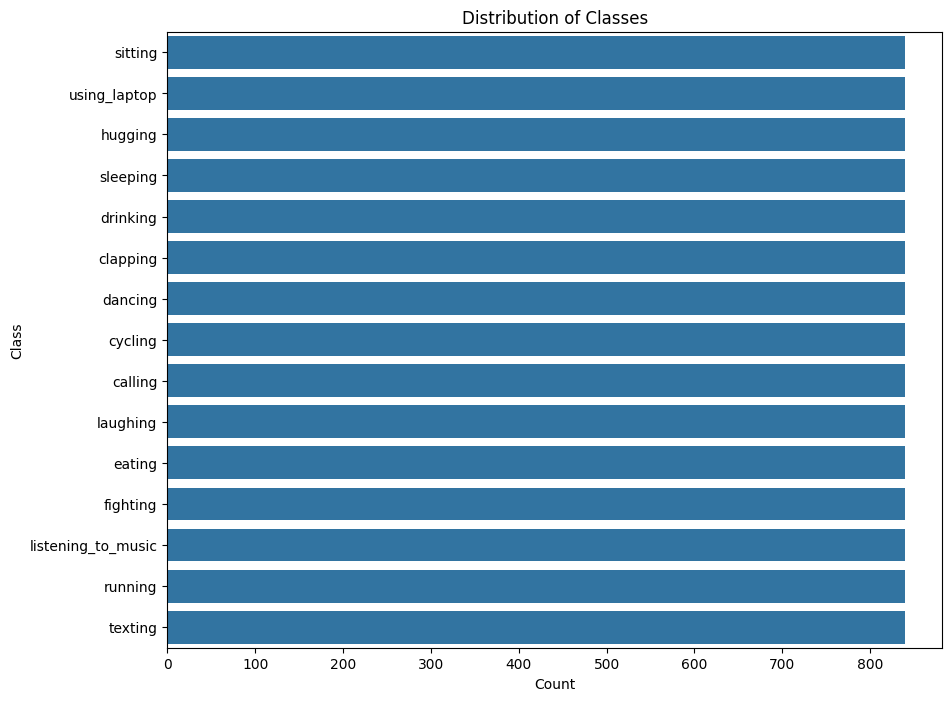

In [12]:
# Image size distribution
image_sizes = []
for filename in labels_df['filename']:
    image_path = os.path.join(data_directory, filename)
    with Image.open(image_path) as img:
        image_sizes.append(img.size)

# Convert image sizes to DataFrame for analysis
sizes_df = pd.DataFrame(image_sizes, columns=['Width', 'Height'])
print("\nImage size distribution:")
print(sizes_df.describe())

# Plotting the distribution of classes
plt.figure(figsize=(10, 8))
sns.countplot(y=labels_df['label'])
plt.title('Distribution of Classes')
plt.xlabel('Count')
plt.ylabel('Class')
plt.show()

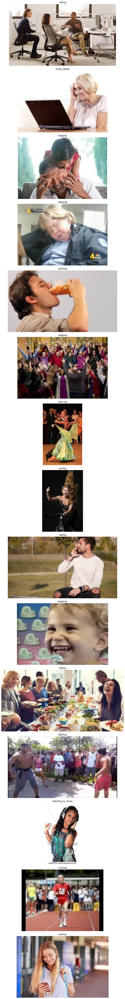

In [13]:
# Displaying a few sample images from each class
unique_classes = labels_df['label'].unique()
plt.figure(figsize=(10, len(unique_classes) * 5)) 
for idx, label in enumerate(unique_classes):
    # Get one image sample for each class
    sample_file = labels_df[labels_df['label'] == label]['filename'].sample(n=1, random_state=1).iloc[0]
    img_path = os.path.join(data_directory, sample_file)
    img = Image.open(img_path)
    plt.subplot(len(unique_classes), 1, idx + 1)
    plt.imshow(img)
    plt.title(label)
    plt.axis('off')
plt.tight_layout()
plt.show()


In [14]:
# Discussing class imbalances and strategies
class_counts = labels_df['label'].value_counts()
print("Class distribution:")
print(class_counts)

# Detecting imbalance
if class_counts.std() > class_counts.mean() * 0.5:  # Threshold for imbalance
    print("Significant class imbalances detected.")
    # Propose strategies such as data augmentation
    print("Consider using data augmentation or resampling techniques to address imbalances.")
else:
    print("No significant class imbalances detected.")

Class distribution:
label
sitting               840
using_laptop          840
hugging               840
sleeping              840
drinking              840
clapping              840
dancing               840
cycling               840
calling               840
laughing              840
eating                840
fighting              840
listening_to_music    840
running               840
texting               840
Name: count, dtype: int64
No significant class imbalances detected.


***(B)***

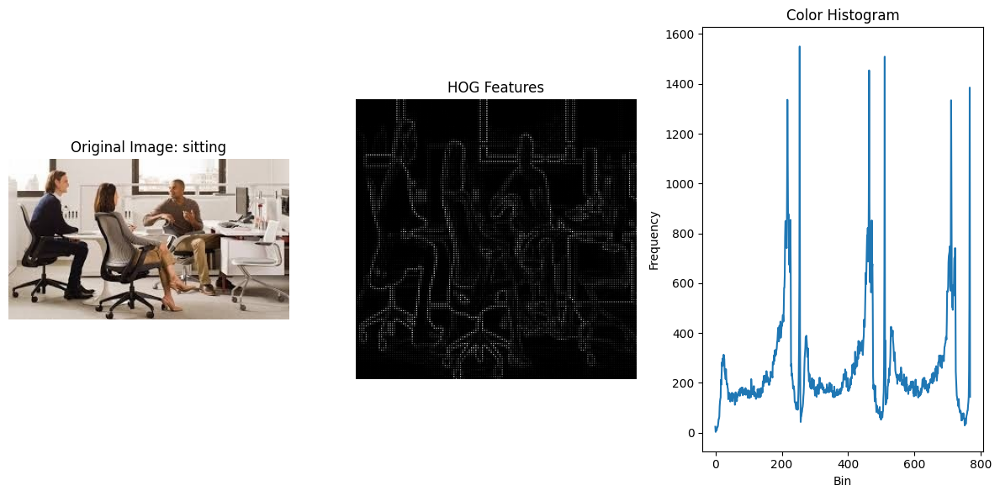

Features extracted for sitting:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


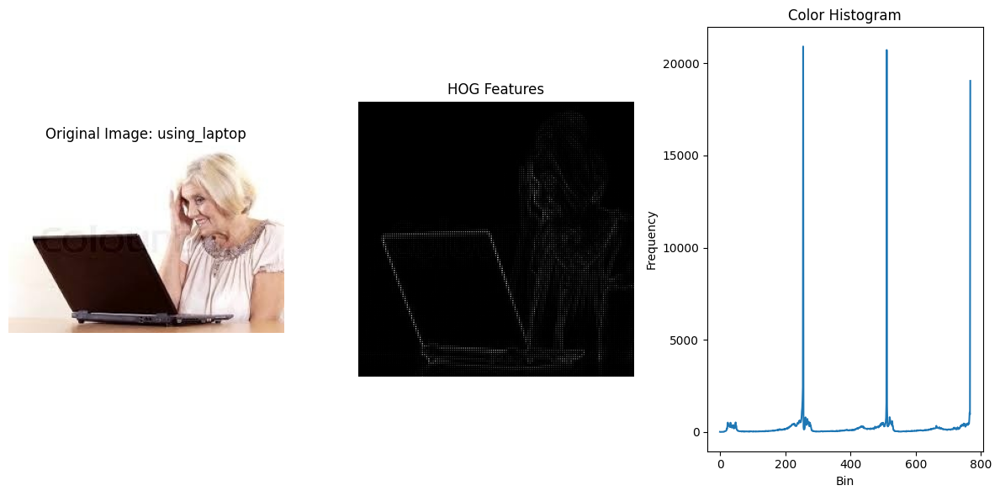

Features extracted for using_laptop:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


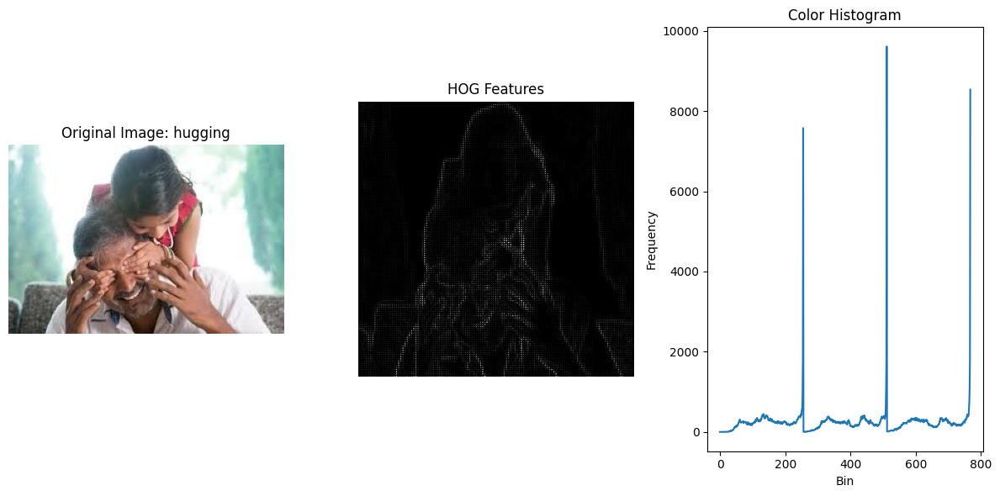

Features extracted for hugging:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


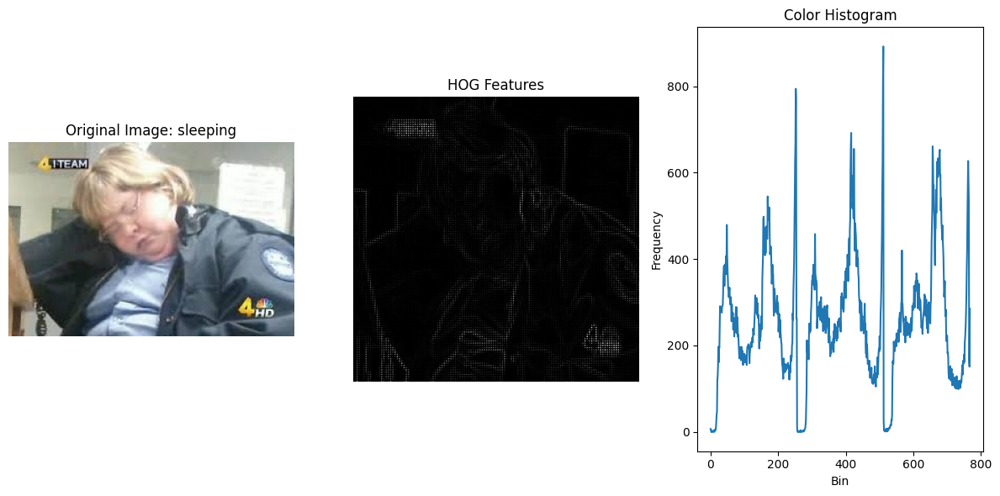

Features extracted for sleeping:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


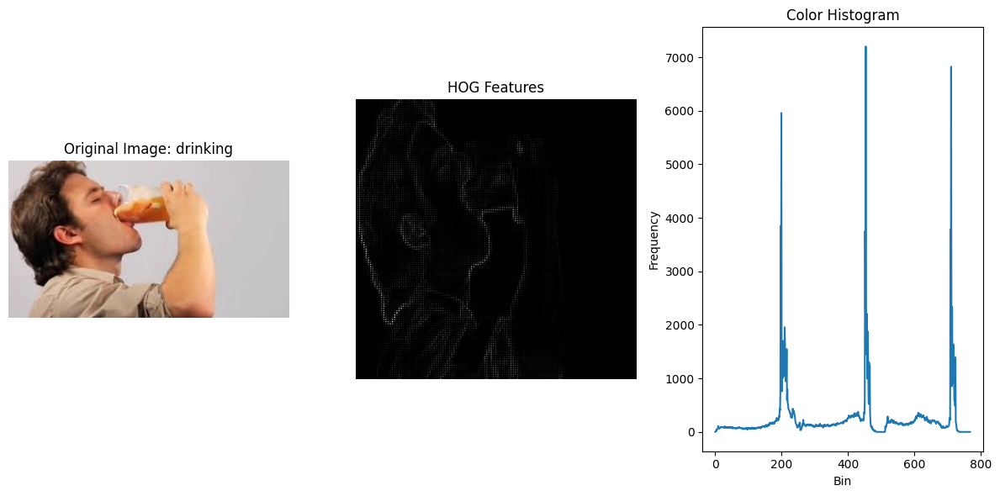

Features extracted for drinking:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


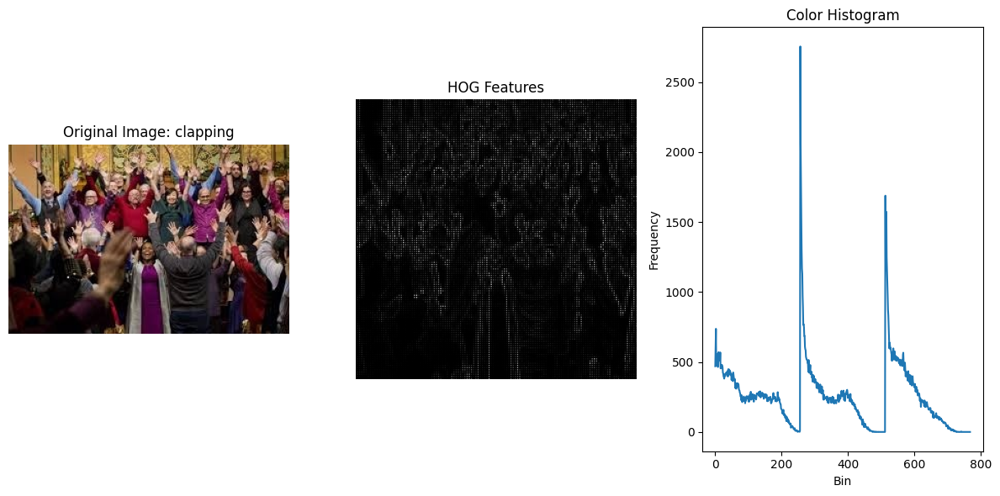

Features extracted for clapping:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


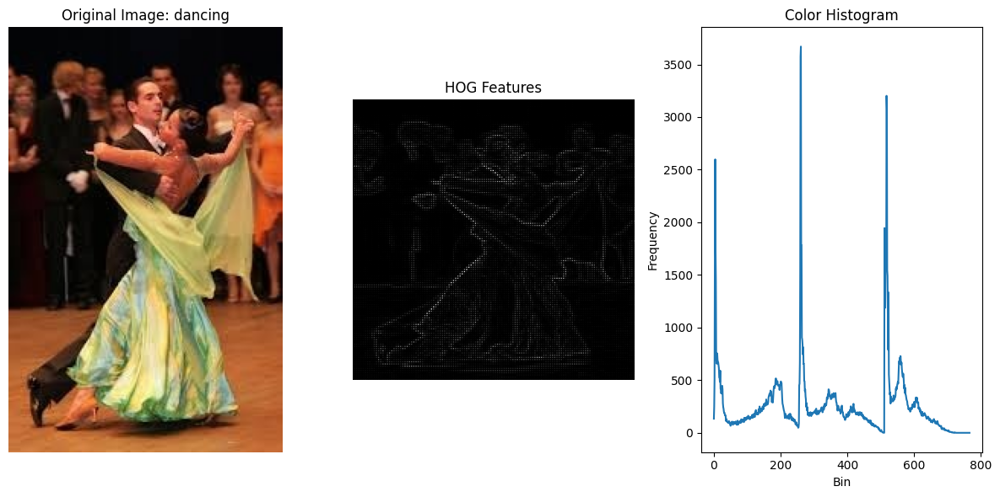

Features extracted for dancing:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


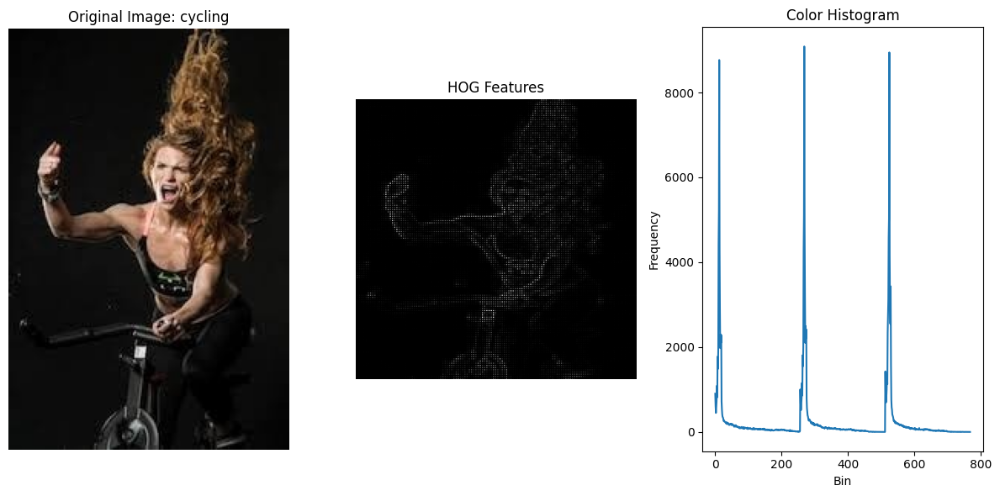

Features extracted for cycling:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


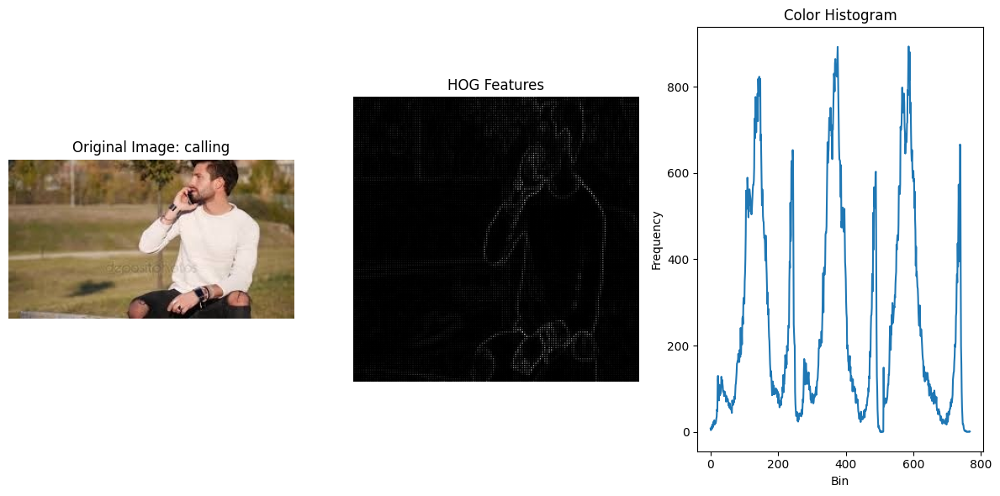

Features extracted for calling:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


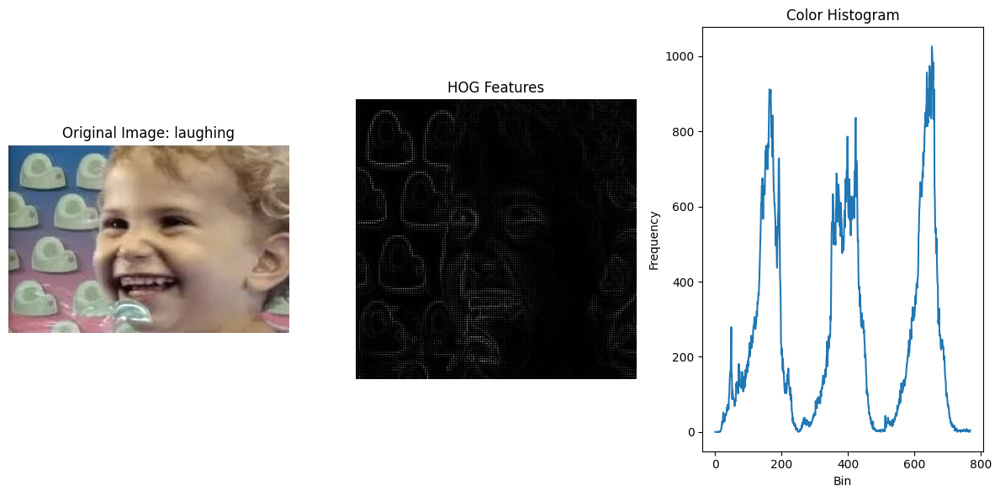

Features extracted for laughing:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


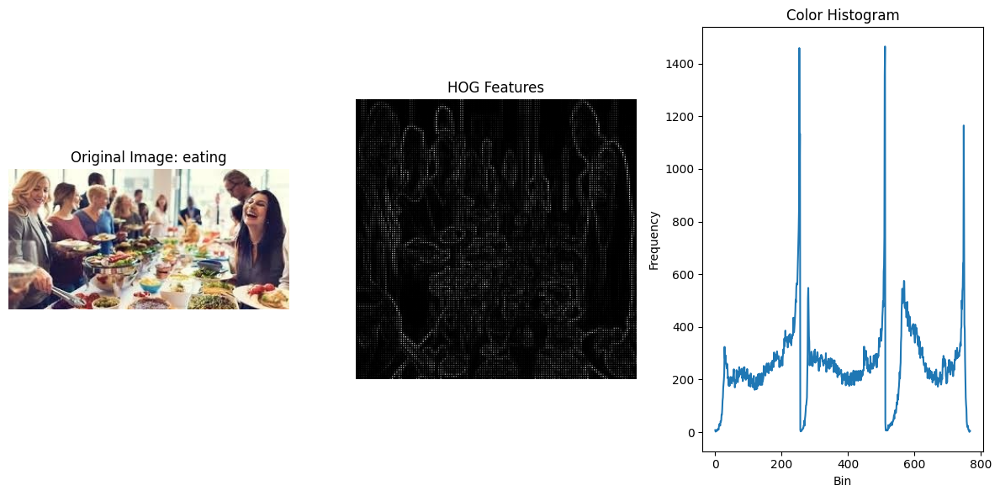

Features extracted for eating:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


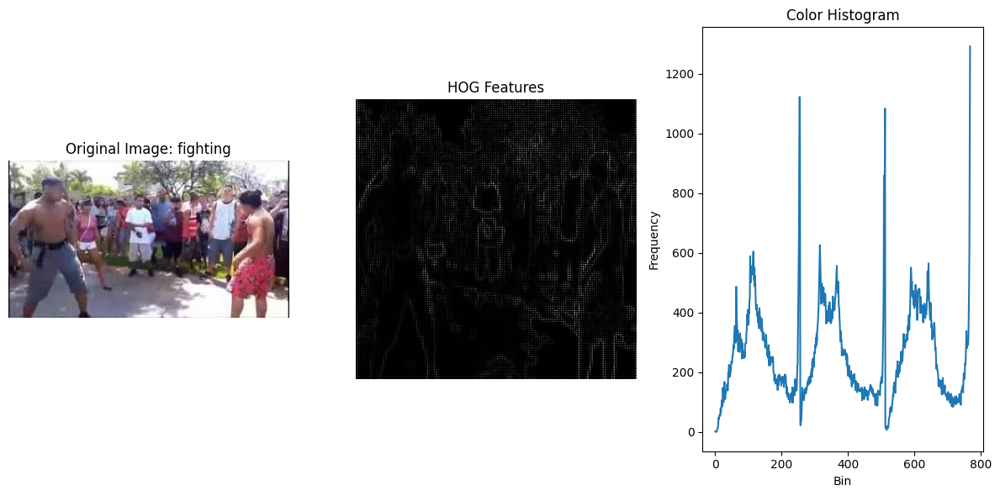

Features extracted for fighting:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


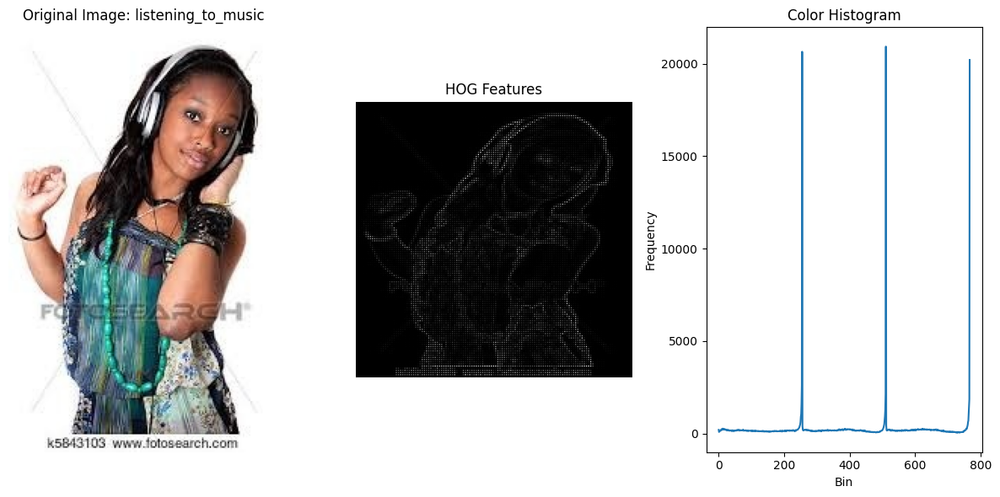

Features extracted for listening_to_music:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


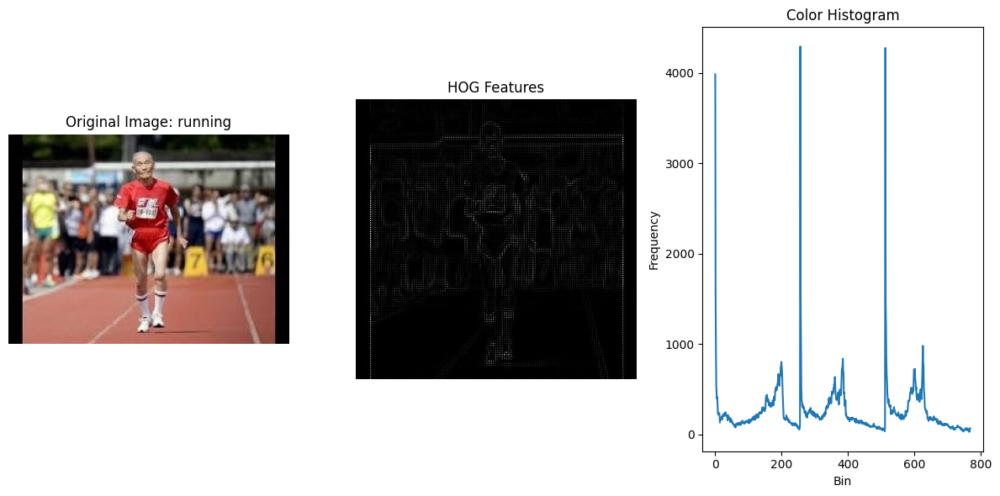

Features extracted for running:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


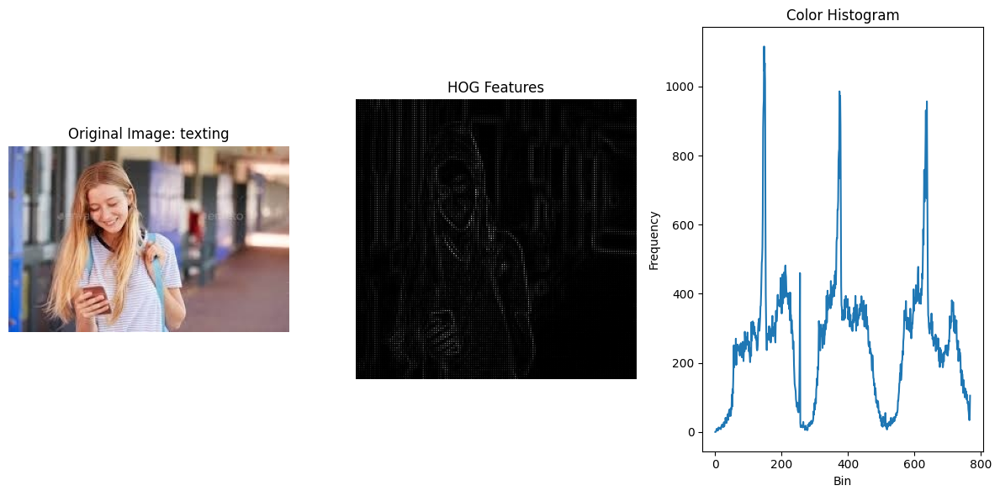

Features extracted for texting:
  HOG Feature Vector Length: 65536
  Color Histogram Sum: 196608


In [15]:

from skimage import data, exposure, io, img_as_float
from skimage.color import rgb2gray
from skimage.feature import hog
from skimage.io import imread
import numpy as np
# Define image size for uniformity
fixed_image_size = (256,256)
def extract_hog_features(image_path,orientations=4, pixels_per_cell=(2, 2),cells_per_block=(1, 1)):
    image = imread(image_path)
    if image.ndim == 3:
        # Convert to grayscale
        image = rgb2gray(image)  
    # Resize image to 256x256 to ensure consistent HOG feature length
    image = Image.fromarray((image * 255).astype(np.uint8)).resize(fixed_image_size)
    image = np.array(image) / 255.0
    # getting hog feature array and image
    fd, hog_image = hog(image, orientations, pixels_per_cell,
                        cells_per_block, visualize=True, feature_vector=True)
    return fd,hog_image

def extract_color_histogram(image_path):
    try:
        # Open the image file and convert  in RGB format
        image = Image.open(image_path).convert('RGB')
        
        # Resize the image to a fixed size (256x256)
        image = image.resize(fixed_image_size)
        
        # Convert the image to a NumPy array
        image = np.array(image) / 255.0 
        
        # Calculate the color histogram for each RGB channel
        histogram_r = np.histogram(image[:, :, 0], bins=256, range=[0, 1])[0]
        histogram_g = np.histogram(image[:, :, 1], bins=256, range=[0, 1])[0]
        histogram_b = np.histogram(image[:, :, 2], bins=256, range=[0, 1])[0]
        
        # Concatenate histograms for all channels (R, G, B)
        histogram = np.concatenate([histogram_r, histogram_g, histogram_b])
        
        return histogram
    except Exception as e:
        print(f"Error processing color histogram for {image_path}: {e}")
        return np.zeros(256 * 3)  # Return a zero array of length 768 (256 bins for each channel)
# Example of extracting features from one image per class
for label in labels_df['label'].unique():
    sample_file = labels_df[labels_df['label'] == label]['filename'].sample(n=1, random_state=1).iloc[0]
    img_path = os.path.join(data_directory, sample_file)

    # Extract HOG features
    features, hog_image = extract_hog_features(img_path)
    
    # Extract Color Histogram
    color_hist = extract_color_histogram(img_path)

    # Plotting
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(Image.open(img_path))
    plt.title(f'Original Image: {label}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(hog_image, cmap='gray')
    plt.title('HOG Features')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.plot(color_hist)
    plt.title('Color Histogram')
    plt.xlabel('Bin')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

    # Print observations if any
    print(f"Features extracted for {label}:")
    print(f"  HOG Feature Vector Length: {len(features)}")
    print(f"  Color Histogram Sum: {np.sum(color_hist)}")


In [16]:
# Prepare the dataset with features and labels
def prepare_dataset(labels_df, orientations, pixels_per_cell, cells_per_block):
    features = []
    labels = []
    
    for index, row in labels_df.iterrows():
        img_path = os.path.join(data_directory, row['filename'])
        
        # Extract HOG features
        hog_features,_ = extract_hog_features(img_path, orientations=orientations,
                                            pixels_per_cell=pixels_per_cell, 
                                            cells_per_block=cells_per_block)
        # Extract color histogram features
        color_hist = extract_color_histogram(img_path)
        
        # Combine HOG and color histogram features
        combined_features = np.hstack([hog_features, color_hist])
        
        features.append(combined_features)
        labels.append(row['label'])
    
    return np.array(features), np.array(labels)

In [17]:
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.model_selection import train_test_split
# from sklearn.feature_selection import RFE
# from sklearn.metrics import accuracy_score
# import matplotlib.pyplot as plt


# # Define parameter grid for HOG feature extraction
# param_grid = {
#     'orientations': [ 8,10,12],
#     'pixels_per_cell': [(8, 8),(16,16),(32,32)],
#     'cells_per_block': [(2, 2), (3, 3), (4,4)]
# }

# # Split the dataset into training and testing sets
# X_train_full, X_test_full, y_train, y_test = train_test_split(labels_df, labels_df['label'], test_size=0.2, random_state=42)

# # Initialize variables to keep track of the best model and parameters
# best_accuracy = 0
# best_params = None
# best_X_train = None
# best_X_test = None

# # Iterate over the parameter grid to find the best HOG configuration
# for orientations in param_grid['orientations']:
#     for pixels_per_cell in param_grid['pixels_per_cell']:
#         for cells_per_block in param_grid['cells_per_block']:
#             print(f"Testing HOG params - Orientations: {orientations}, Pixels/Cell: {pixels_per_cell}, Cells/Block: {cells_per_block}")
            
#             # Extract HOG features with current parameters
#             X_train, y_train = prepare_dataset(X_train_full, orientations, pixels_per_cell, cells_per_block)
#             X_test, y_test = prepare_dataset(X_test_full, orientations, pixels_per_cell, cells_per_block)
            
#             # Train a Random Forest classifier with current HOG features
#             clf = RandomForestClassifier(n_estimators=100, random_state=42)
#             clf.fit(X_train, y_train)
            
#             # Make predictions and evaluate accuracy
#             y_pred = clf.predict(X_test)
#             accuracy = accuracy_score(y_test, y_pred)
#             print(f"Accuracy: {accuracy * 100:.2f}%")
            
#             # Update best model if this configuration is better
#             if accuracy > best_accuracy:
#                 best_accuracy = accuracy
#                 best_params = {'orientations': orientations, 'pixels_per_cell': pixels_per_cell, 'cells_per_block': cells_per_block}
#                 best_X_train = X_train
#                 best_X_test = X_test

# print(f"\nBest HOG Params: {best_params}")
# print(f"Best Accuracy: {best_accuracy * 100:.2f}%")

In [18]:
#from the above commented code i found that the best params for hog feature were orientaion=8 ,pixel_per_cell=(32,32)and the cells_per_block=(8,8)
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
# Split the dataset into training and testing sets
X_train_full, X_test_full, y_train, y_test = train_test_split(labels_df, labels_df['label'], test_size=0.2, random_state=42)
# Extract HOG features with current parameters

X_train, y_train = prepare_dataset(X_train_full, 8,(32,32), (8,8))
X_test, y_test = prepare_dataset(X_test_full, 8,(32,32), (8,8))

***RandomForest***

In [19]:
# Train a Random Forest classifier with current HOG features
clf_random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
clf_random_forest.fit(X_train, y_train)

# Make predictions and evaluate accuracy
y_pred = clf_random_forest.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 30.08%


***XGBoost (highest achieved)*** 

In [20]:
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

# Encode the labels
label_encoder = LabelEncoder()

# Fit the LabelEncoder and transform the training and test labels
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Initialize the XGBoost classifier and  Fit the model on the training data
clf_XG = XGBClassifier(n_estimators=100, random_state=42, eval_metric='logloss')


clf_XG.fit(X_train, y_train_encoded)

# Make predictions on the test data
y_pred_encoded = clf_XG.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)

# Print the accuracy
print(f"Accuracy: {accuracy * 100:.2f}%")



Accuracy: 35.83%


In [21]:
import pickle
# Save the trained model to a pickle file
with open('xgb_model.pkl', 'wb') as f:
    pickle.dump(clf_XG, f)


In [30]:
import pickle
from sklearn.metrics import accuracy_score
with open('xgb_model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)
y_pred_loaded = loaded_model.predict(X_test)
accuracy_loaded = accuracy_score(y_test_encoded, y_pred_loaded)
print(accuracy_loaded*100)


35.833333333333336
